In [1]:
import numpy as np                  # handles arrays and matrices operations
import os                           # directories and data
import matplotlib.pyplot as plot    # plotting curve
from PIL import Image               # import images
import cv2                          # openCV, image display and overlap
from sklearn.cluster import KMeans  # apply K-means
import random                       # random selections
from skimage import io              # image display

from keras.models import Model, load_model
from keras.layers import Input, BatchNormalization, Conv2D, MaxPooling2D, Dense, Dropout, LeakyReLU, UpSampling2D, concatenate
from keras.optimizers import Adam, SGD
from keras.callbacks import ModelCheckpoint

In [2]:
# from google.colab.patches import cv2_imshow

# load images from directory
def LoadImage(name, path="/content/drive/My Drive/Colab Notebooks/cityscapes_data/cityscapes_data/train"):

    img = Image.open(path + "/" + name)
    img = np.array(img)
    
    # extracting segmented part
    seg = img[:, 256:]
    # extracting image part
    img = img[:, 0:256]

    # removing car bonut in image
    seg = seg[:200, :]
    img = img[:200, :]
    
    img = np.array(img)
    seg = np.array(seg)
    return img/255, seg/255

## CLASSIFYING COLOR SPACE using CLUSTERING

Dataset has image with corresponding segmented mask

*   Object classes - Need to derive from pixel color
*   However pixel values for even same object are different 
*   This is possibly due to change in pixel values image compression and conversion to current jpg form

Assigning classes
1.   Manually assigning color centers and mapping pixel to nearest center - tedious and not consistent with pixel groups
2.   Use k-Means clustering for grouping image pixel into classes



# KMeans Clustering

*   Randomly select 400 images from training set 
*   Add points in 3D space (correponding to pixel - GBR format with value 0.0 to 1.0)

*   Perform clustering, K = 14.
*   On observing segmented masks - saw 14-15 colors to represent different objects and map pixels to classes


> Blue - Locomotive (car/bike)

> Red - People

> Pink - Pavement

> Yellow - Light/Sign board

> Green - Trees/bushes

> Light green - Grass

> Greenish blue - Bus/train

> Violet - Road

> Black - Car bonnet / traffic sign / pole

> Gray - Buildings

> Sky blue - Sky

> Purple - Sodewalk

> Peach - Parking area

> Brown - shops



















In [3]:
# Classify pixel colors into distinct classes and apply segmentation

from random import sample

train_size = 2975

# randomly selecting 400 images from training set to apply clustering (all pixels from these images) and select 14 color classes
sequence = [i for i in range(train_size)]
#select 300 random training images
subset = sample(sequence, 300)

files = os.listdir("/content/drive/My Drive/Colab Notebooks/cityscapes_data/cityscapes_data/train")

colors = []
for i in subset:
    img, seg = LoadImage(files[i])
    # print("%d " %(i))
    colors.append(seg.reshape(seg.shape[0]*seg.shape[1], 3))

colors = np.array(colors)
# colors contains all pixels represented as points in 3D plane - coordinates are GBR(0 to 1 each)
colors = colors.reshape((colors.shape[0]*colors.shape[1],3))

#Run K-means clustering
km = KMeans(14).fit(colors)

In [4]:
 # give values of color centers obtained in K-means
center_colors = km.cluster_centers_
# for K-means had scaled value down by 255, revert back (factor along each dimension 255, no change with clustering)
center_colors = center_colors * 255
center_colors = center_colors.astype(int)

# display color centeres in RGB color format
print(center_colors)

[[127  62 127]
 [ 69  70  69]
 [106 139  35]
 [  3   2 137]
 [198  58 186]
 [158 244 156]
 [241  36 229]
 [ 76 126 172]
 [  8  10  12]
 [196 156 157]
 [215 203  33]
 [205  25  60]
 [121 129  95]
 [ 90   8  66]]


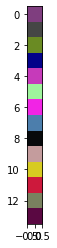

In [5]:
# TO DISPLAY - OBTAINED COLORS AFTER APPLYING K-MEANS CLUSTERING

n = len(center_colors)

x = np.zeros((n,1,3))
for k in range(n): 
  x[k][0][0] = center_colors[k][0]
  x[k][0][1] = center_colors[k][1]
  x[k][0][2] = center_colors[k][2]

plot.imshow(x / 255)

In [6]:
# have segment (result image mask after segmentation)
# convert it into categorical format

def ColorsToClass(seg):
    s = seg.reshape((seg.shape[0]*seg.shape[1],3))
    s = km.predict(s)
    s = s.reshape((seg.shape[0], seg.shape[1]))
    
    # number of color centers
    n = len(center_colors)
    
    cls = np.zeros((seg.shape[0], seg.shape[1], n))
    
    for i in range(n):
        m = np.copy(s)
        m[m!=i] = -1   #all not class i - mark -1
        m[m!=-1] = 1   #left (class i) - mark 1
        m[m==-1] = 0   #mark again to 0 (non class i)
        
        # marking for class i for segment's pixels
        cls[:,:,i] = m
        
    return cls


In [7]:
# Build image showing classified pixels - to visualize resultant after preprocessing
def LayersToRGBImage(img):
    
    nimg = np.zeros((img.shape[0], img.shape[1], 3))  # length, breadth and RGB
    
    # img.shape[2] - No of classes
    
    for i in range(img.shape[2]):
        c = img[:,:,i]               # image array, class i? 1: Yes, 0:No (those pixels in class i - have 1 marked against them)
        # col = colors[i]
        col = center_colors[i]       # corresponding RGB color for class i
        
        for j in range(3):            # each in RGB
            nimg[:,:,j] += col[j]*c   # add class i's color value for corresponding pixels (having c[length_pos][width_pos] = 1)

    nimg = nimg/255.0
    return nimg

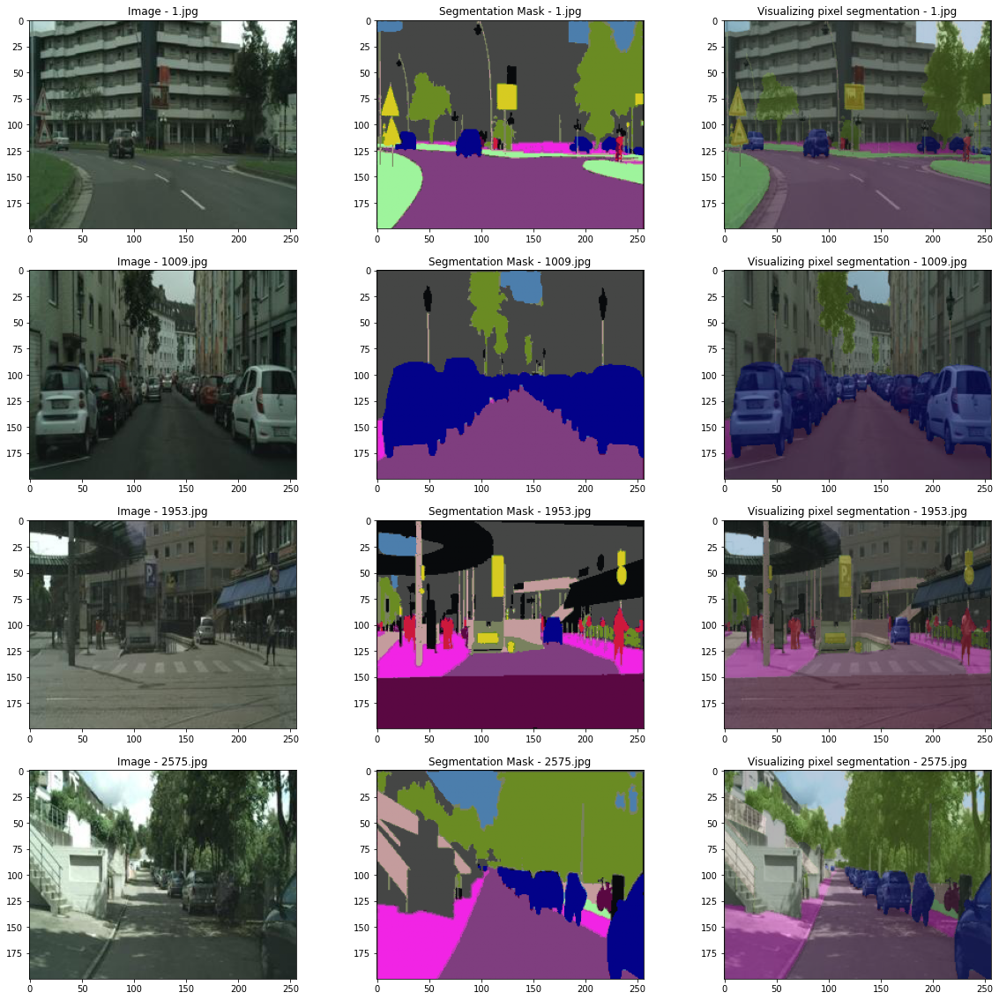

In [8]:
# Test image after preprocessing
def show_image(name):
  img, seg = LoadImage(name)
  seg2 = ColorsToClass(seg)
  seg2 = LayersToRGBImage(seg2)
  total = cv2.addWeighted(img, .6, seg2, 0.4, 0)
  
  return img, seg2, total


plot.figure(figsize = (20,20))
names = ["1.jpg", "1009.jpg", "1953.jpg", "2575.jpg"]
for i in range(len(names)):

  img, seg, total = show_image(names[i])
  
  plot.subplot(len(names), 3, i*3 + 1)
  plot.title("Image - "  + names[i])
  plot.imshow(img)

  plot.subplot(len(names), 3, i*3 + 2)
  plot.title("Segmentation Mask - " + names[i])
  plot.imshow(seg)

  plot.subplot(len(names), 3, i*3 + 3)
  plot.title("Visualizing pixel segmentation - " + names[i])
  plot.imshow(total)
plot.show()

In [9]:
# generate images, segments for training and validating data
def Generate(path="/content/drive/My Drive/Colab Notebooks/cityscapes_data/cityscapes_data/train", batch_size = 16):
    
    # images in training set
    files = os.listdir(path)
    while True:

    # generators which add image when iterated over file (train images)
      imgs=[]
      segs=[]
      
      # iterables
      for i in range(batch_size):
          file = random.sample(files,1)[0]
          
          # flip=False
          # if random.random() > 0.5:
          #     flip=True
          
          # angle = maxangle*(random.random()*2-1)
          
          img, seg = LoadImage(file, path)
          
          seg = ColorsToClass(seg)
          
          imgs.append(img)
          segs.append(seg)
      # return generator    
      yield np.array(imgs), np.array(segs)


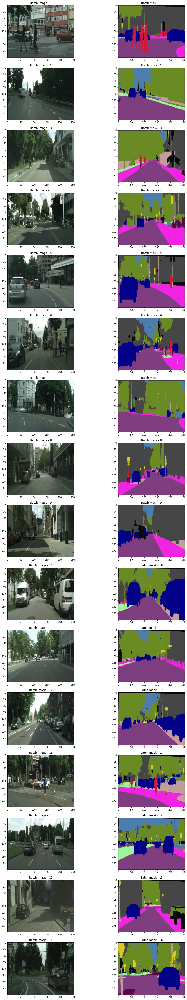

In [10]:
# generator function (default generate batch for TRAINING SET)
gen = Generate()
# generate a next random batch (after one previously generated)
imgs, segs = next(gen)

# print(imgs.shape)

n = len(imgs)

plot.figure(figsize = (16, 80))   # column by row space demarcated
for i in range(n):
  plot.subplot(n, 2, i*2 + 1)
  plot.title("Batch image - %d" %(i+1))
  plot.imshow(imgs[i])

  plot.subplot(n, 2, i*2 + 2)
  plot.title("Batch mask - %d" %(i+1))
  plot.imshow(LayersToRGBImage(segs[i]))
plot.show()

In [11]:
# BUILDING U-Net components

# encoder block (for downsampling using ConvBlocks and pooling)
def encoder(inp, channels, kernel_size, act_func):
  x = Conv2D(channels, kernel_size, activation = act_func, padding = "same")(inp)
  x = Conv2D(channels, kernel_size, activation = act_func, padding = "same")(x)
  p = MaxPooling2D()(x)                           # Maxpooling - halving block size (channels same)

  return p, x 

# decoder block (for upsampling using Transpose convolution blocks)
def decoder(inp, channels, kernel_size, act_func, skip_conv):
  x = UpSampling2D()(inp)                         # Upsample (inverse mapping of MaxPooling)
  x = concatenate([x, skip_conv])
  x = Conv2D(channels, kernel_size, activation = act_func, padding = "same")(x)
  x = Conv2D(channels, kernel_size, activation = act_func, padding = "same")(x)
  
  return x

# bottle neck (bottom most component - WHEN channels highest and object dimension lowest)
def bottle_neck(inp, channels, kernel_size, act_func):
  x = Conv2D(channels, kernel_size, activation = act_func, padding = "same")(inp)
  x = Conv2D(channels, kernel_size, activation = act_func, padding = "same")(x)

  return x

In [12]:
# BUILDING MODEL using above blocks
inp = Input(shape=(200, 256, 3))  # length X Width X colors(channels)

x = BatchNormalization()(inp)
p1, x1 = encoder(x, 64, 3, "relu")
p1 = Dropout(0.1)(p1)


#x2 = BatchNormalization()(x1)
p2, x2 = encoder(p1, 128, 3, "relu")
p2 = Dropout(0.1)(p2)


#x3 = BatchNormalization()(x2)
p3, x3 = encoder(p2, 256, 3, "relu")
p3 = Dropout(0.1)(p3)


#x4 = BatchNormalization()(x3)
x4 = bottle_neck(p3, 512, 3, "relu")
x4 = Dropout(0.1)(x4)


u5 = decoder(x4, 256, 3, "relu", x3)
u5 = Dropout(0.1)(u5)



u6 = decoder(u5, 128, 3, "relu", x2)
u6 = Dropout(0.1)(u6)


u7 = decoder(u6, 64, 3, "relu", x1)

x8 = Conv2D(len(center_colors), 1, activation="softmax")(u7)


model = Model(inp, x8)

opt = Adam(lr=0.001)
model.compile(optimizer=opt,
             loss="categorical_crossentropy",
             metrics=["accuracy"])

model.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 200, 256, 3) 0                                            
__________________________________________________________________________________________________
batch_normalization (BatchNorma (None, 200, 256, 3)  12          input_1[0][0]                    
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 200, 256, 64) 1792        batch_normalization[0][0]        
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, 200, 256, 64) 36928       conv2d[0][0]                     
______________________________________________________________________________________________

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/optimizer_v2/optimizer_v2.py:375: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  "The `lr` argument is deprecated, use `learning_rate` instead.")


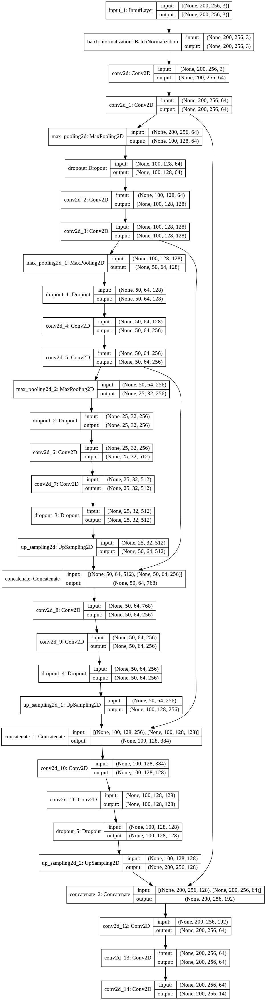

In [13]:
# Vizualizing the U-net model
from keras.utils.vis_utils import plot_model
plot_model(model, to_file='model_plot.png', show_shapes=True, show_layer_names=True)

In [14]:
train_gen = Generate()
val_gen = Generate("/content/drive/My Drive/Colab Notebooks/cityscapes_data/cityscapes_data/val")

In [15]:
clb = [ModelCheckpoint("loss.h5", save_best_only=True, verbose=0)]

h = model.fit(train_gen, epochs = 30, steps_per_epoch = 50, validation_data=val_gen, validation_steps=20, callbacks = clb)

Epoch 1/30
50/50 [==============================] - 140s 2s/step - loss: 2.2338 - accuracy: 0.2339 - val_loss: 2.0578 - val_accuracy: 0.2776
Epoch 2/30
50/50 [==============================] - 67s 1s/step - loss: 1.7652 - accuracy: 0.4308 - val_loss: 2.9754 - val_accuracy: 0.2963
Epoch 3/30
50/50 [==============================] - 63s 1s/step - loss: 1.3174 - accuracy: 0.5946 - val_loss: 2.9012 - val_accuracy: 0.3391
Epoch 4/30
50/50 [==============================] - 57s 1s/step - loss: 1.2365 - accuracy: 0.6210 - val_loss: 2.0722 - val_accuracy: 0.4491
Epoch 5/30
50/50 [==============================] - 52s 1s/step - loss: 1.1201 - accuracy: 0.6584 - val_loss: 1.7644 - val_accuracy: 0.5198
Epoch 6/30
50/50 [==============================] - 46s 922ms/step - loss: 1.1293 - accuracy: 0.6604 - val_loss: 1.3597 - val_accuracy: 0.5927
Epoch 7/30
50/50 [==============================] - 44s 895ms/step - loss: 1.0403 - accuracy: 0.6878 - val_loss: 1.2323 - val_accuracy: 0.6302
Epoch 8/30
50

In [16]:
# save model
model.save("model.h5")
# load weights giving best results
model = load_model("loss.h5")

# model.save("/content/drive/My Drive/Colab Notebooks/cityscapes_data")

In [17]:
# model = load_model("/content/drive/My Drive/Colab Notebooks/cityscapes_data")

[2.0577871799468994, 2.9754106998443604, 2.901197671890259, 2.072181224822998, 1.7643764019012451, 1.3596875667572021, 1.2323254346847534, 1.0000855922698975, 1.0197956562042236, 0.8908337354660034, 0.8941124081611633, 0.8954145312309265, 0.84770667552948, 0.8517009019851685, 0.8048804998397827, 0.8157809376716614, 0.8658117055892944, 0.8400940895080566, 0.7977088689804077, 0.7780506610870361, 0.8036378622055054, 0.7939823865890503, 0.7365442514419556, 0.7279485464096069, 0.7108041048049927, 0.7273709774017334, 0.7394999265670776, 0.7712324857711792, 0.715173602104187, 0.7339789271354675]
[0.27764612436294556, 0.29627153277397156, 0.339072585105896, 0.4491035044193268, 0.5197940468788147, 0.5927480459213257, 0.6301588416099548, 0.7009971141815186, 0.6919968128204346, 0.7428408265113831, 0.7411395311355591, 0.734263002872467, 0.7488066554069519, 0.7536355257034302, 0.7676464319229126, 0.7607197761535645, 0.7477192878723145, 0.7575563788414001, 0.7667701244354248, 0.7733082175254822, 0.7

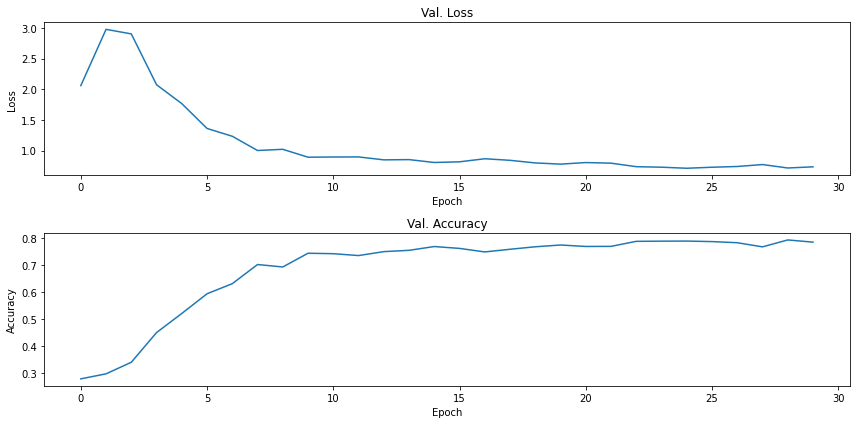

In [18]:
# plot loss and accuracy (validation set)
loss = h.history["val_loss"]
acc = h.history["val_accuracy"]

print(loss)
print(acc)

plot.figure(figsize=(12, 6))
plot.subplot(2, 1, 1)
plot.title("Val. Loss")
plot.plot(loss)
plot.xlabel("Epoch")
plot.ylabel("Loss")

plot.subplot(2, 1, 2)
plot.title("Val. Accuracy")
plot.plot(acc)
plot.xlabel("Epoch")
plot.ylabel("Accuracy")

plot.tight_layout()
plot.savefig("learn.png", dpi=150)
plot.show()

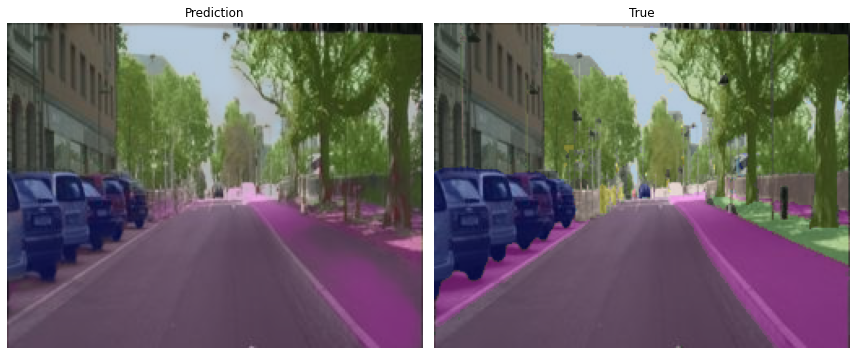

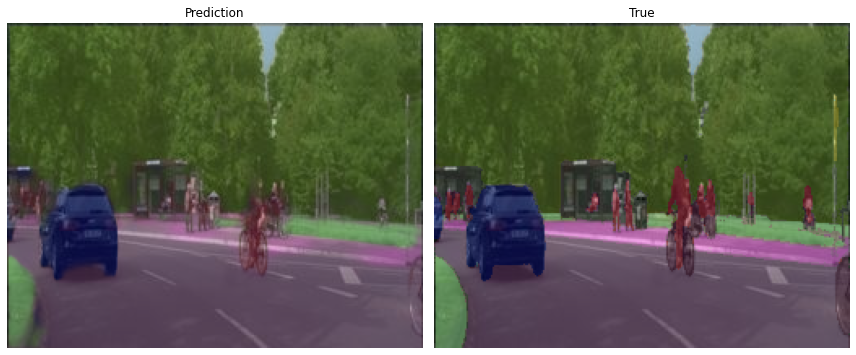

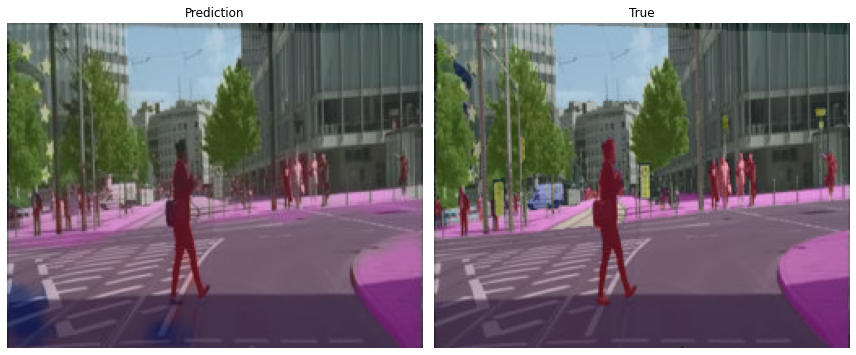

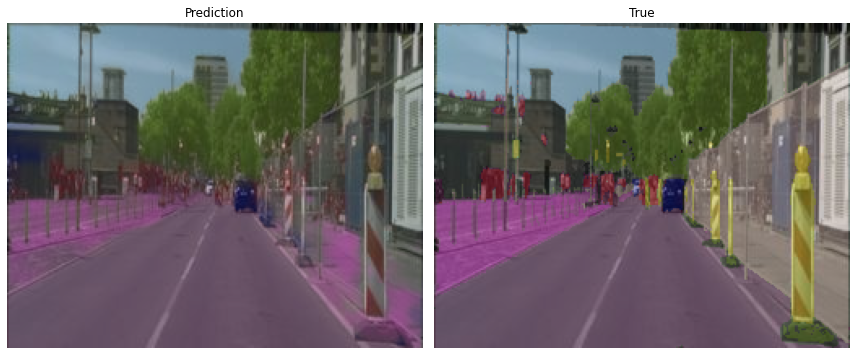

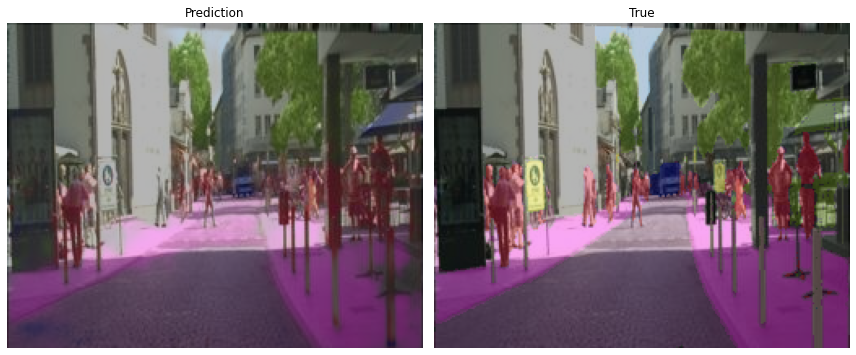

...

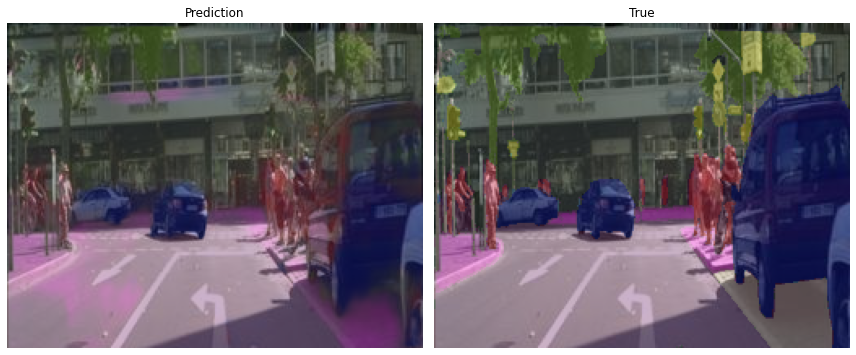

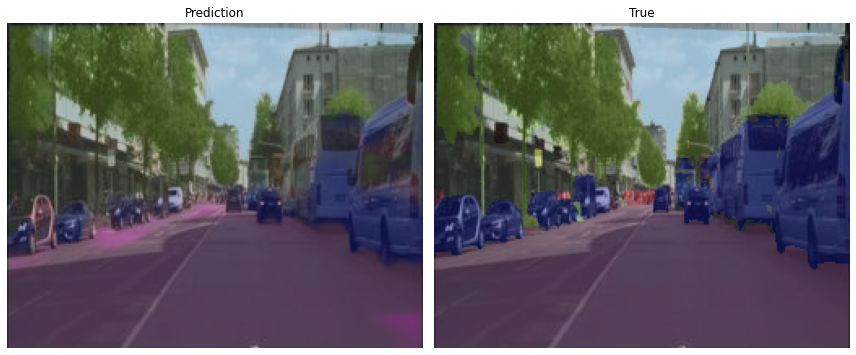

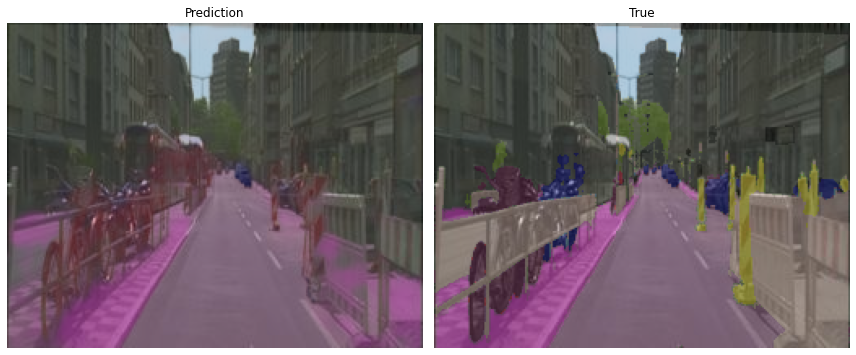

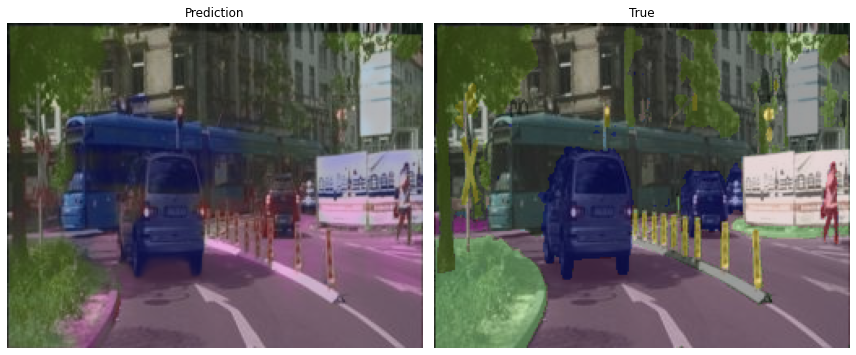

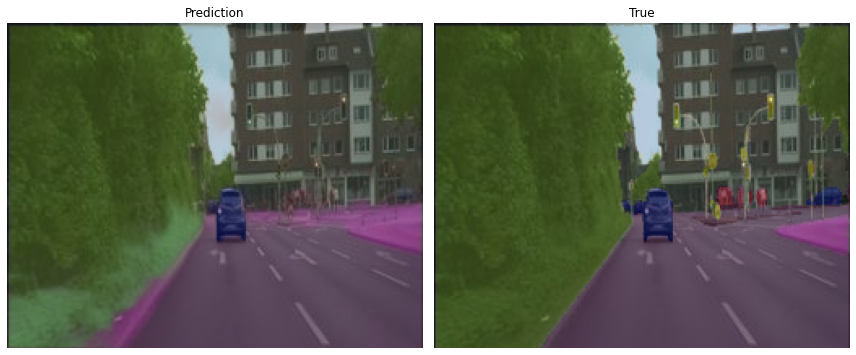

In [19]:
# generate test case to check prediction
test_gen = Generate("/content/drive/My Drive/Colab Notebooks/cityscapes_data/cityscapes_data/val")
max_show=20
for imgs, segs in test_gen:
    p = model.predict(imgs)   #model prediction
    for i in range(p.shape[0]):
        if i > max_show:
            break
        _p = LayersToRGBImage(p[i])
        _s = LayersToRGBImage(segs[i])
        
        predimg = cv2.addWeighted(imgs[i], 0.6, _p, 0.4, 0)
        trueimg = cv2.addWeighted(imgs[i], 0.6, _s, 0.4, 0)
        plot.figure(figsize=(12,6))
        plot.subplot(121)
        plot.title("Prediction")
        plot.imshow(predimg)
        plot.axis("off")
        plot.subplot(122)
        plot.title("True")
        plot.imshow(trueimg)
        plot.axis("off")
        plot.tight_layout()
        plot.savefig("pred_"+str(i)+".png", dpi=150)
        plot.show()
    break

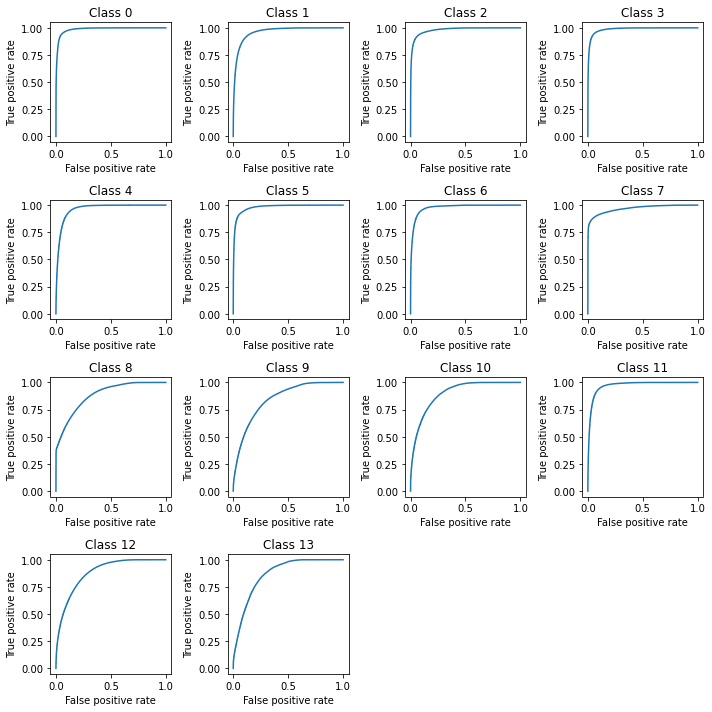

In [20]:
# Evaluation metrics
from sklearn.metrics import roc_curve, balanced_accuracy_score
test_gen = Generate("/content/drive/My Drive/Colab Notebooks/cityscapes_data/cityscapes_data/val", batch_size=200)
max_show=20

bass = []

for imgs, segs in test_gen:
    p = model.predict(imgs)
    
    plot.figure(figsize=(10, 10))
    for i in range(p.shape[-1]):
        fpr, tpr, _ = roc_curve(segs[:,:,:,i].ravel(), p[:,:,:,i].ravel())
        
        _p = np.round(p[:,:,:,i].ravel()).astype(np.int32)
        bas = balanced_accuracy_score(segs[:,:,:,i].ravel(), _p)
        
        bass.append(bas)
        
        plot.subplot(4,4,i+1)
        plot.plot(fpr, tpr)
        plot.title("Class "+str(i))
        plot.xlabel("False positive rate")
        plot.ylabel("True positive rate")
    
    plot.tight_layout()
    plot.show()
    
    break

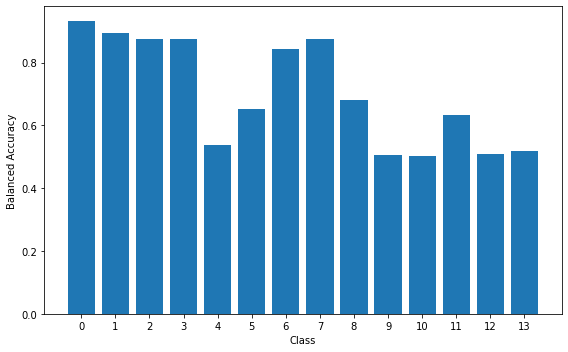

In [21]:
plot.figure(figsize=(8, 5))
plot.bar(np.arange(0, len(bass)), bass)
plot.xticks(np.arange(0, len(bass)))
plot.ylabel("Balanced Accuracy")
plot.xlabel("Class")
plot.tight_layout()
plot.savefig("bas.png")
plot.show()